In [1]:
#venv
!pwd

/home/argon/prog/AIapply/notebooks


In [2]:
# from sklearn.preprocessing import LabelBinarizer
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import classification_report
# from keras.models import Sequential
# from keras.layers.core import Dense
# from keras.optimizers import SGD
# from imutils import paths
# import argparse
# import pickle
import os
os.chdir('..')
from lib.includes import *

Using TensorFlow backend.


## load data function
## train, val, test = func()
## better pandas read csv 
## sparse matrix
## suppose to use tqdm widget

## train

In [3]:
images = "data/cig_butts/train/images/"
img = np.array([cv2.imread(f"{images}{x}") for x in os.listdir(images)])

img_ids = np.array([int(x.split('.')[0]) for x in os.listdir(images)])

annotations = json.load(open(f"{images}../coco_annotations.json", "r"))
masks = np.array([get_mask(img_id, annotations) for img_id in img_ids])
print(img.shape)

(2000, 512, 512, 3)


In [6]:
import pandas as pd
annotations_df = pd.read_json(json.dumps(annotations.get('images'))).\
                    drop('license', axis=1).set_index('file_name')

In [8]:
annotations_df.head(3)

,width,height,id
file_name,,,
00000000.jpg,512,512,0
00000001.jpg,512,512,1
00000002.jpg,512,512,2


In [67]:
annotations

{'info': {'description': 'ImmersiveLimit Cigarette Butt Dataset',
  'url': 'http://www.immersivelimit.com',
  'version': '0.1',
  'year': 2018,
  'contributor': 'Adam Kelly',
  'date_created': '2018/07/27'},
 'licenses': [{'url': 'http://www.immersivelimit.com/noncommercial-educational-license-agreement',
   'id': 0,
   'name': 'ImmersiveLimit.com Non-Commercial, Educational License Agreement'}],
 'images': [{'license': 0,
   'file_name': '00000000.jpg',
   'width': 512,
   'height': 512,
   'id': 0},
  {'license': 0,
   'file_name': '00000001.jpg',
   'width': 512,
   'height': 512,
   'id': 1},
  {'license': 0,
   'file_name': '00000002.jpg',
   'width': 512,
   'height': 512,
   'id': 2},
  {'license': 0,
   'file_name': '00000003.jpg',
   'width': 512,
   'height': 512,
   'id': 3},
  {'license': 0,
   'file_name': '00000004.jpg',
   'width': 512,
   'height': 512,
   'id': 4},
  {'license': 0,
   'file_name': '00000005.jpg',
   'width': 512,
   'height': 512,
   'id': 5},
  {'lice

# val 

In [4]:
val_images = "data/cig_butts/val/images/"
val_img = np.array([cv2.imread(f"{val_images}{x}") for x in os.listdir(val_images)])

val_img_ids = np.array([int(x.split('.')[0]) for x in os.listdir(val_images)])

annotations = json.load(open(f"{val_images}../coco_annotations.json", "r"))
val_masks = np.array([get_mask(img_id, annotations) for img_id in val_img_ids])

In [32]:
import pandas as pd
annotations_df = pd.read_json(json.dumps(annotations.get('images'))).\
                    drop(['license', 'file_name'], axis=1).set_index('id')
annotations_df.head()

,width,height
id,,
0,512,512
1,512,512
2,512,512
3,512,512
4,512,512


## GET MODEL HERE
## get dice of val pred

In [35]:
masks_pred_score = []

for img, mask in zip(val_img[:2], val_masks[:2]): #FIXME
    img_arr = np.array(img)
    results = model.detect([img_arr], verbose=0)
    r = results[0]
    pred_mask = r['masks']
    pred_mask = get_wb_mask(pred_mask)
    dice = get_dice(pred_mask, mask)
    masks_pred_score.append(dice)
    
# masks_pred = tuple(zip(val, masks_pred))
masks_pred_score = np.array(masks_pred_score)

In [99]:
# masks_pred_score
# get_dice(masks_pred[0][1], val_masks[0])

## final df

In [192]:
tmp_df = annotations_df.head(2)
tmp_df['dice'] = masks_pred_score

In [193]:
# annotations_df.describe()
tmp_df

,width,height,dice
id,,,
0,512,512,0.925913
1,512,512,0.948298


## just crop the img train
## is it GrabCut?

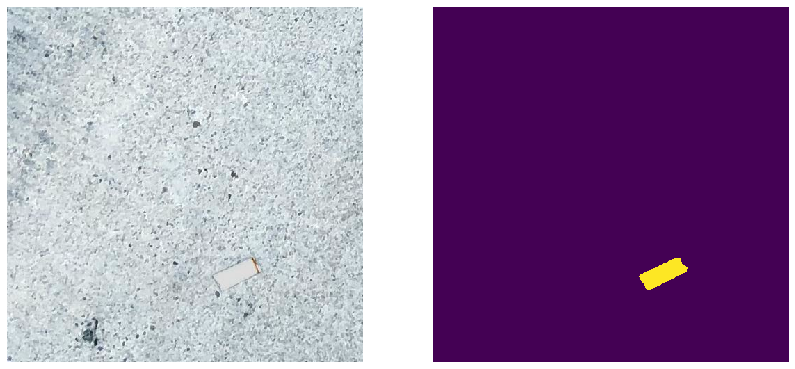

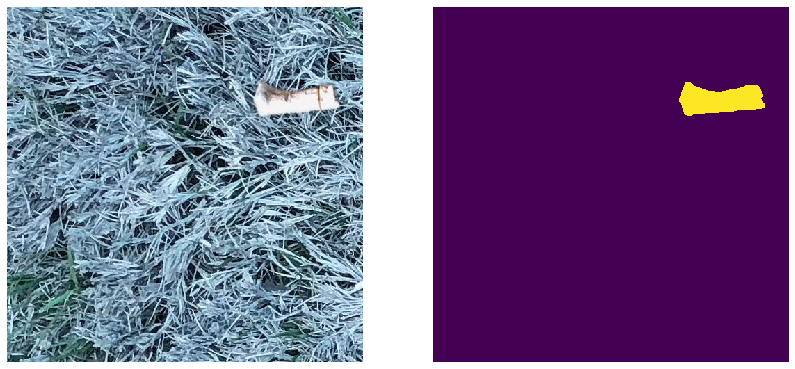

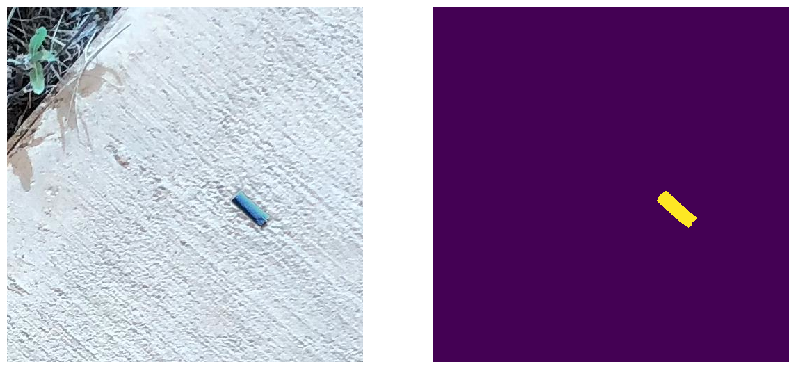

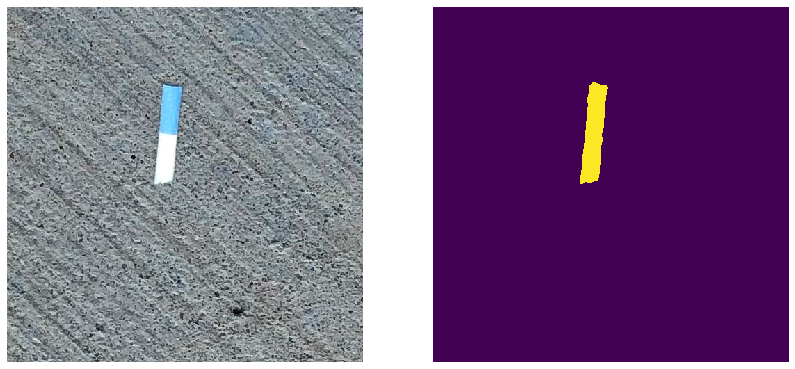

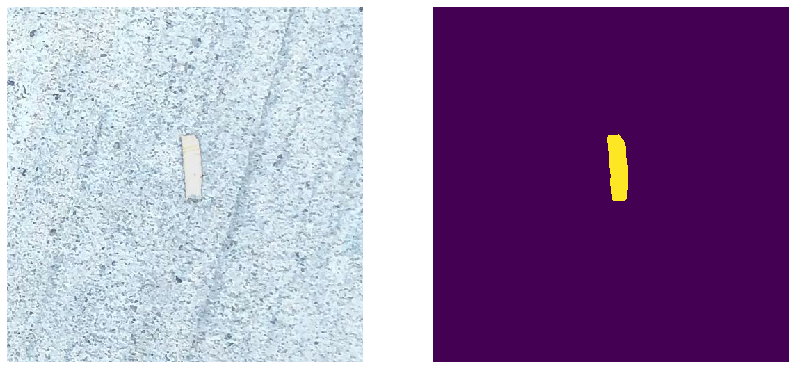

...

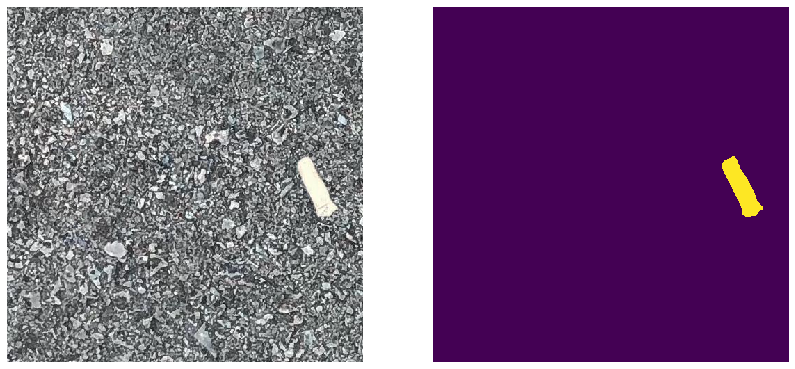

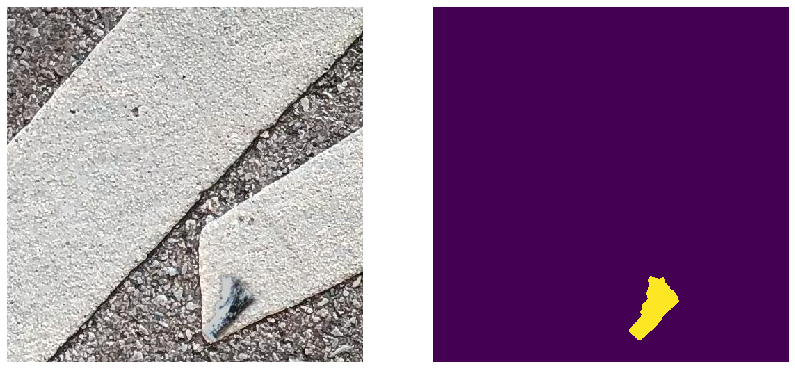

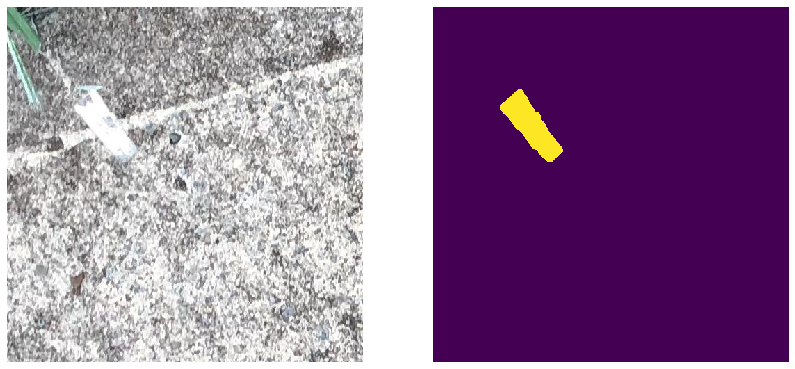

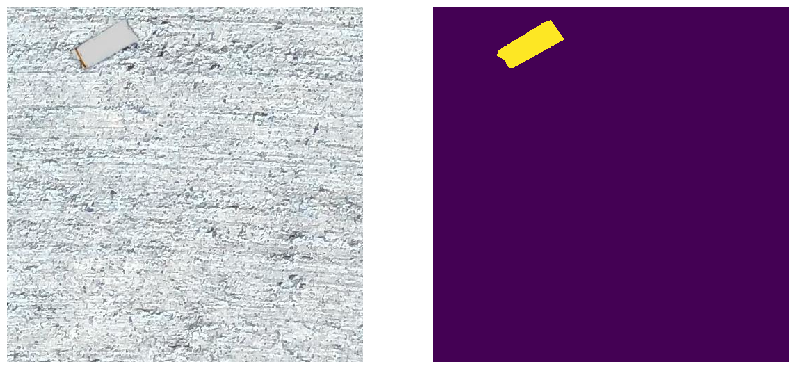

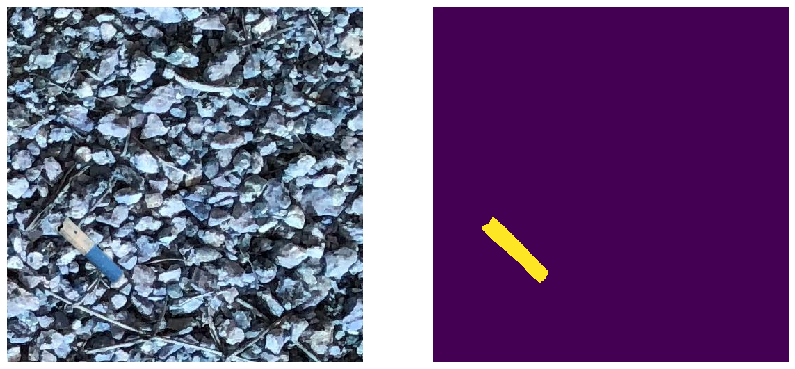

In [359]:
for i in range(12):
    show_img_with_mask(img[i], masks[i])

In [9]:
from lib.grab_cut import expected_cropped, cropped_cig

In [51]:
lst = cropped_cig((0, 1))

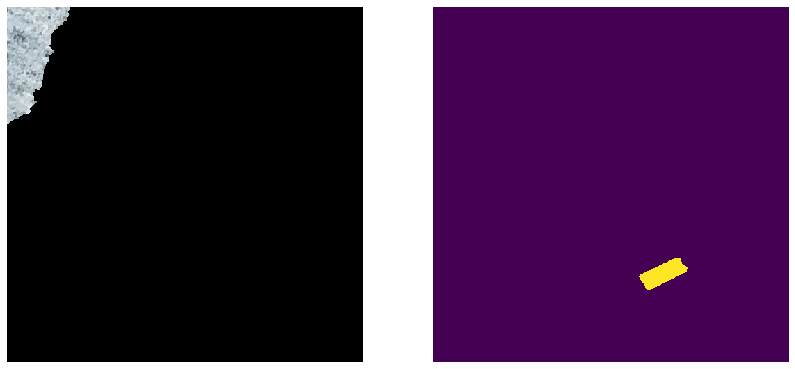

In [52]:
for i in range(1):
    show_img_with_mask(lst[i], masks[i])

In [54]:
260508**0.5 # nonzero in mask

510.399843260164

In [11]:
test = expected_cropped(11)

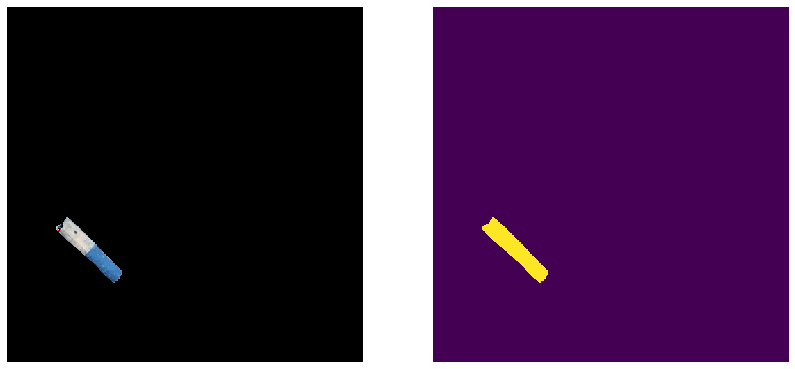

In [12]:
show_img_with_mask(test, masks[11])

## test

In [27]:
test_images = "data/cig_butts/real_test/"
test_img = np.array([cv2.imread(f'{test_images}{x}') for x in os.listdir(test_images)])

In [34]:
def get_wb_mask(mask):
    mask = np.sum([mask[:,:,i] for i in range(mask.shape[2])], axis=0)
    return mask

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
[0.9993299 0.9985172]


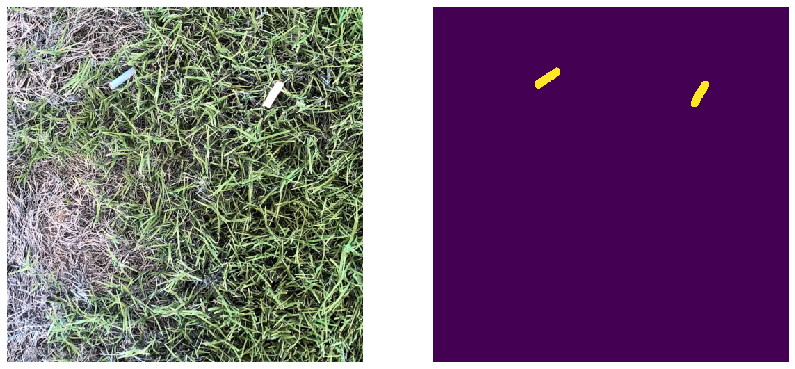

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
[0.9994947  0.9993812  0.9990747  0.9987155  0.99817705 0.99812514
 0.9927327  0.9803531 ]


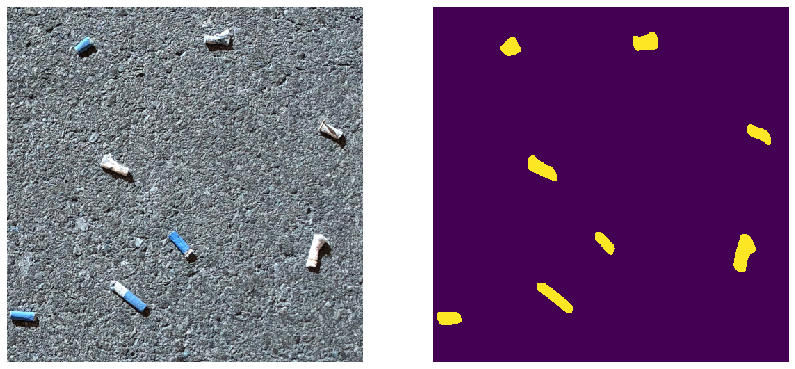

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
[0.9990902  0.9990682  0.99482286 0.9935632  0.99177927 0.9270009
 0.8839504 ]


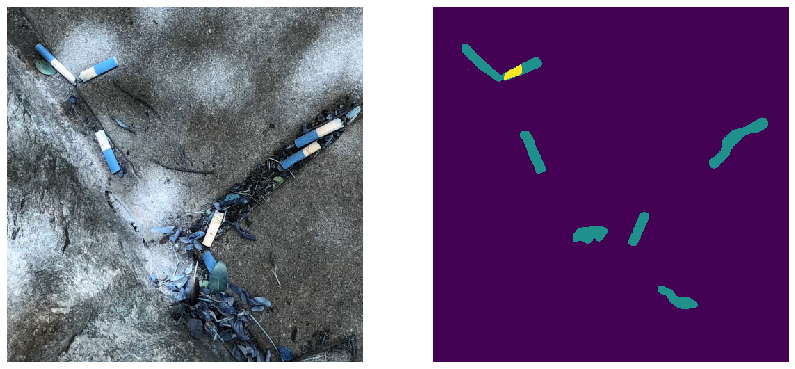

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
[0.9986565  0.9902672  0.960909   0.9488051  0.9360865  0.8874246
 0.86592555 0.85825235]


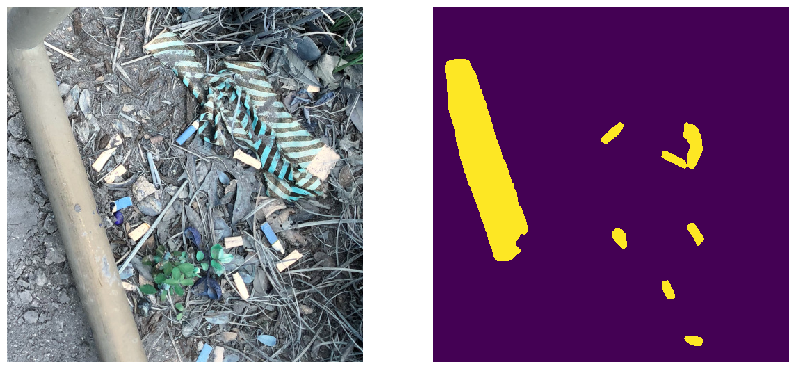

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
[0.9992969]


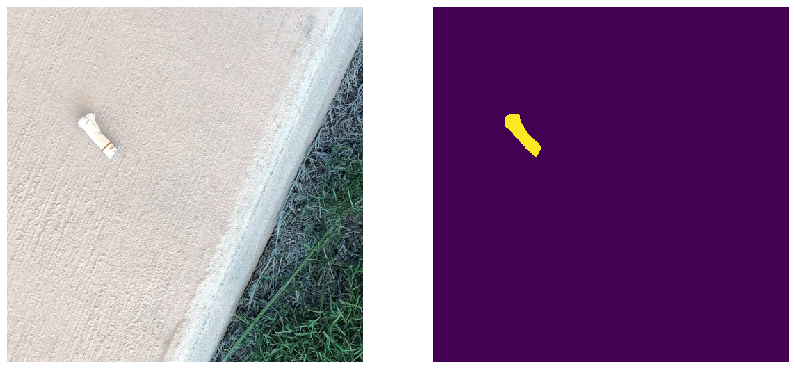

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
[0.99587715]


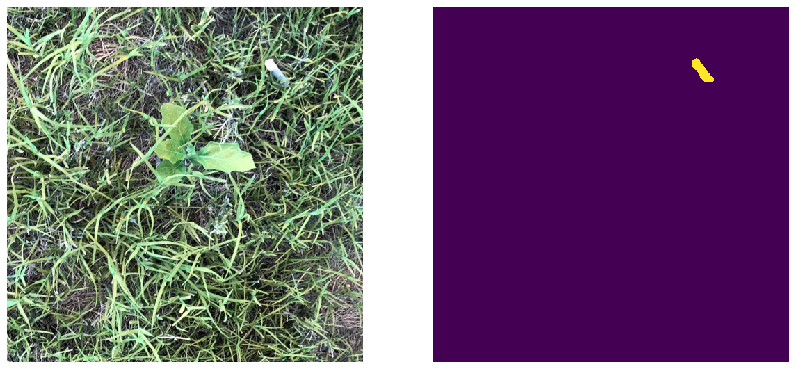

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
[0.99552625]


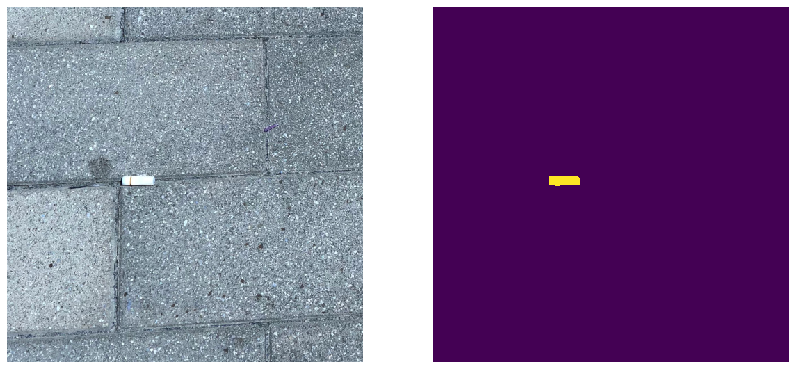

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
[0.9988217 0.9955005]


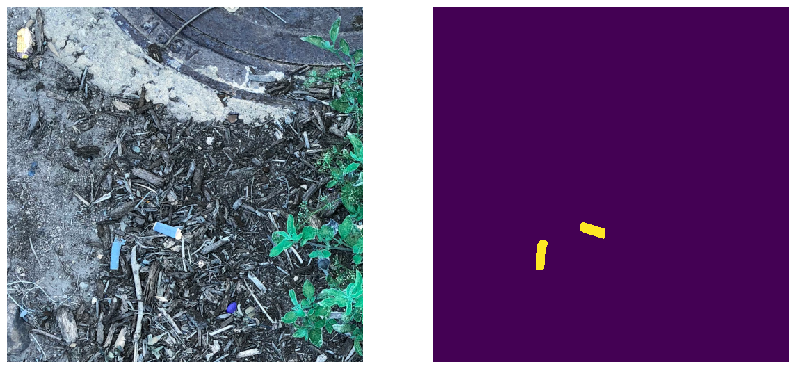

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
[0.9994742 0.9950537]


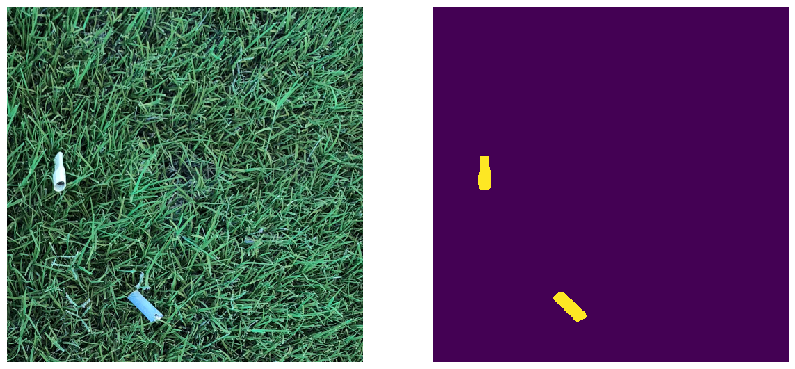

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
[0.9997485  0.99892044 0.989253  ]


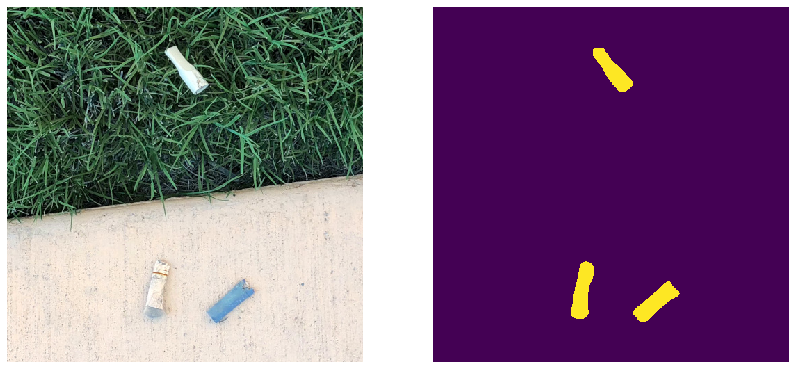

In [55]:
for img in test_img:
    img_arr = np.array(img)
    results = model.detect([img_arr], verbose=1)
    r = results[0]
    mask = r['masks']
    mask = get_wb_mask(mask)
    print('CONFIDENCE_SCORE\t', r['scores'])
    show_img_with_mask(img, mask)    

In [60]:
from lib.grab_cut import expected_cropped, cropped_cig
mask = expected_cropped(mask)
show_img_with_mask(test_img[9], mask) # REDO FUNC

NameError: name 'masks' is not defined

## end test

## now have to work out mask detection for test
# RCNN framework

In [3]:
# ! git clone https://github.com/matterport/Mask_RCNN.git
# using resnet-101 with coco

In [5]:
MODEL_DIR = os.path.join(Mask_RCNN, "mrcnn/logs")
TRAINED_MODEL = os.path.join(Mask_RCNN, "trained_weights/mask_rcnn_cig_butts_0008.h5")

In [6]:
from Mask_RCNN.mrcnn import model as modellib
# unfortunately I build venv with tf 2.0 and rcnn works with lower v
# found problem through wasted hours
# had to change a little model.py

'''
tf.log() -> tf.math.log()
tf.sets.set_intersection() -> tf.sets.intersection()
tf.sparse_tensor_to_dense() -> tf.sparse.to_dense()
tf.to_float() -> tf.cast([value], tf.float32)
'''

'\ntf.log() -> tf.math.log()\ntf.sets.set_intersection() -> tf.sets.intersection()\ntf.sparse_tensor_to_dense() -> tf.sparse.to_dense()\ntf.to_float() -> tf.cast([value], tf.float32)\n'

## First model resnn50

In [7]:
from mrcnn.config import Config

In [8]:
class CocoSynthConfig(Config):
    """Configuration for training on the box_synthetic dataset.
    Derives from the base Config class and overrides specific values.
    """
    # Give the configuration a recognizable name
    NAME = "cocosynth_dataset"

    # Train on 1 GPU and 1 image per GPU. Batch size is 1 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + 1 butt

    # All of our training images are 512x512
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512

    # You can experiment with this number to see if it improves training
    STEPS_PER_EPOCH = 1000

    # This is how often validation is run. If you are using too much hard drive space
    # on saved models (in the MODEL_DIR), try making this value larger.
    VALIDATION_STEPS = 5
    
    # Matterport originally used resnet101, but I downsized to fit it on my graphics card
    BACKBONE = 'resnet50'

    # To be honest, I haven't taken the time to figure out what these do
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)
    TRAIN_ROIS_PER_IMAGE = 32
    MAX_GT_INSTANCES = 50 
    POST_NMS_ROIS_INFERENCE = 500 
    POST_NMS_ROIS_TRAINING = 1000 
    
config = CocoSynthConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE              

In [9]:
class InferenceConfig(CocoSynthConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    DETECTION_MIN_CONFIDENCE = 0.85
    

inference_config = InferenceConfig()

In [10]:
# Recreate the model in inference mode
rcnn_model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

Instructions for updating:
Colocations handled automatically by placer.


In [11]:
# Get path to saved weights
# model_path = 'Mask_RCNN/logs/cocosynth_dataset20200218T1528/mask_rcnn_cocosynth_dataset_0004.h5'
model_path = 'Mask_RCNN/logs/cocosynth_dataset20200217T1533/mask_rcnn_cocosynth_dataset_0004.h5'
# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
rcnn_model.load_weights(model_path, by_name=True)

Loading weights from  Mask_RCNN/logs/cocosynth_dataset20200217T1533/mask_rcnn_cocosynth_dataset_0004.h5
Re-starting from epoch 4


In [85]:
rcnn_layers = model.get_trainable_layers()
load_model(dict(enumerate(rcnn_layers)))

ValueError: Cannot create group in read only mode.

In [125]:
from keras import layers
from keras import models
from keras import regularizers
from keras import optimizers
from keras.callbacks import ModelCheckpoint

def create_model():
    model = models.Sequential()
    rcnn_layers = rcnn_model.get_trainable_layers()
    for _ in rcnn_layers:
        model.add(_)
    regularizer = regularizers.l1_l2(l1=0.01, l2=0.01)
    model.add(layers.Flatten())
    model.add(layers.Dense(256, input_dim=8))
    model.add(layers.Dense(64, activation='relu',\
                   kernel_regularizer=regularizer, init='uniform'))
    
    model.add(layers.BatchNormalization(epsilon=1e-06, mode=0, momentum=0.9, weights=None))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(1, activation='sigmoid'))
    optimizer = optimizers.SGD(lr=2e-3, decay=1e-6, momentum=0.9, nesterov=True)
    model.compile(loss='binary_crossentropy', optimizer=optimizer)
    return model

def train():
    checkpointer = ModelCheckpoint(filepath="/Mask_RCNN/mrcnn/logs/weights.h5", verbose=1, save_best_only=True)
    history = model.fit(img, masks, nb_epoch=40, batch_size=8,\
                        validation_data=(val_img, val_masks), verbose=2, callbacks=[checkpointer])

def load_trained_model(weights_path):
    model = create_model()
    model.load_weights(weights_path, by_name=True)

In [126]:
# load_trained_model(model_path)
model = create_model()

In [127]:
load_trained_model(model_path)

In [128]:
train()

ValueError: Input 0 is incompatible with layer res2a_branch1: expected axis -1 of input shape to have value 64 but got shape (None, 253, 253, 256)

### hasn't found out the way merging rcnn Config and keras Layer
### so don't have trainable network
### but have a better one - dataframe of network

In [55]:
pd.read_json(json.dumps(model.get_config().get('layers')))

,class_name,config
0,Conv2D,"{'name': 'conv1', 'trainable': True, 'filters'..."
1,BatchNorm,"{'name': 'bn_conv1', 'trainable': True, 'axis'..."
2,Conv2D,"{'name': 'res2a_branch2a', 'trainable': True, ..."
3,BatchNorm,"{'name': 'bn2a_branch2a', 'trainable': True, '..."
4,Conv2D,"{'name': 'res2a_branch2b', 'trainable': True, ..."
...,...,...
131,Flatten,"{'name': 'flatten_1', 'trainable': True, 'data..."
132,Dense,"{'name': 'dense_3', 'trainable': True, 'batch_..."
133,BatchNormalization,"{'name': 'batch_normalization_1', 'trainable':..."
134,Dropout,"{'name': 'dropout_1', 'trainable': True, 'rate..."


## 101 seems to be less effic

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


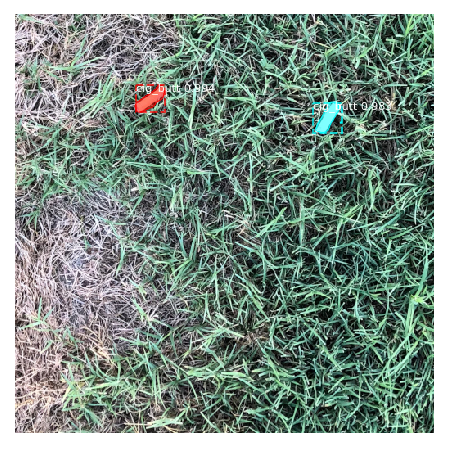

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


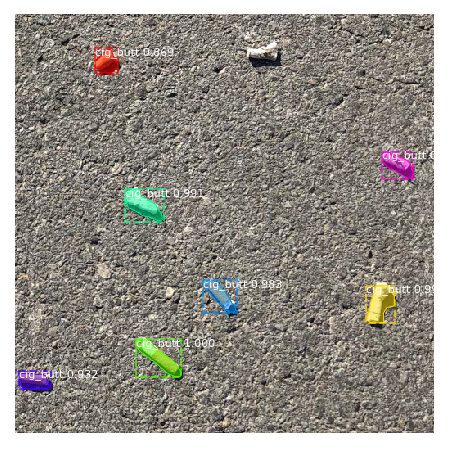

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


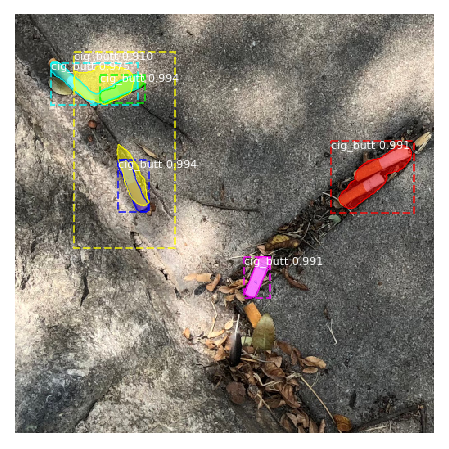

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


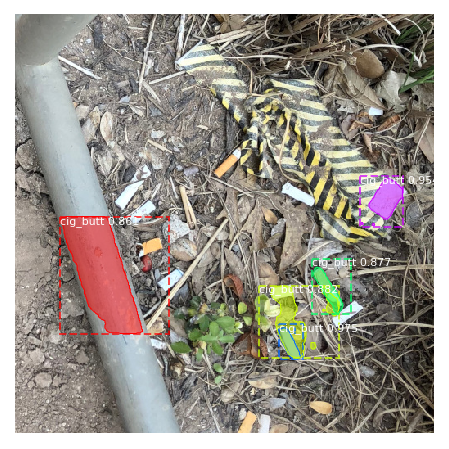

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


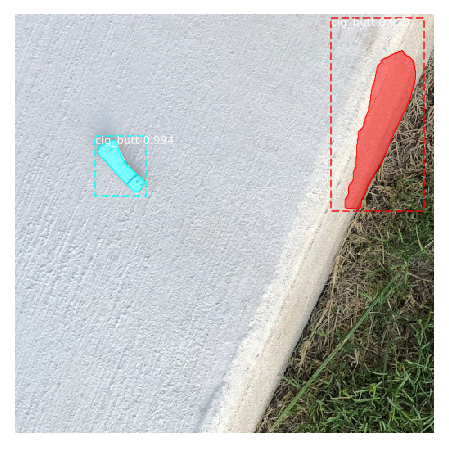

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


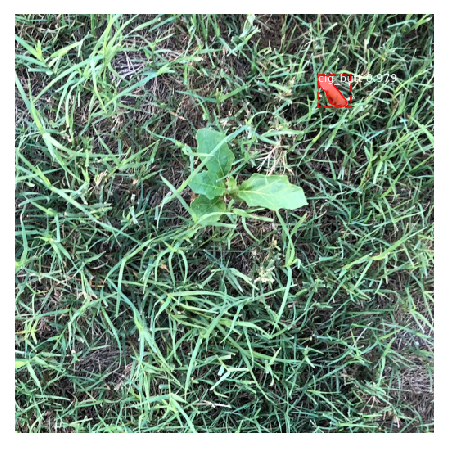

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -112.80000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


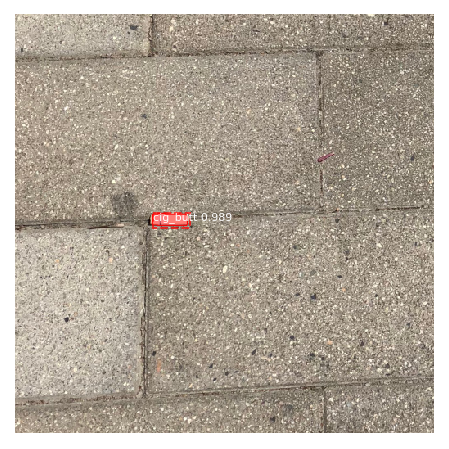

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


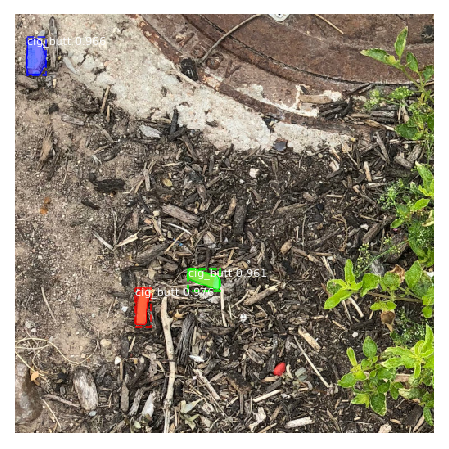

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


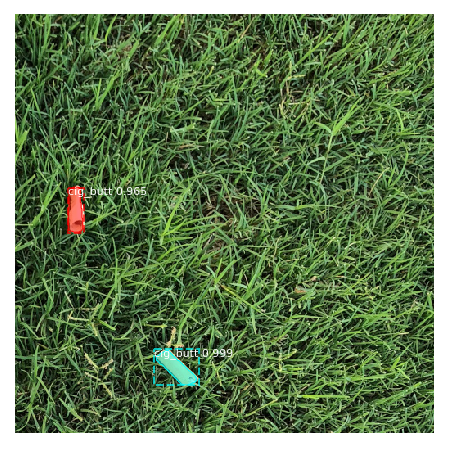

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


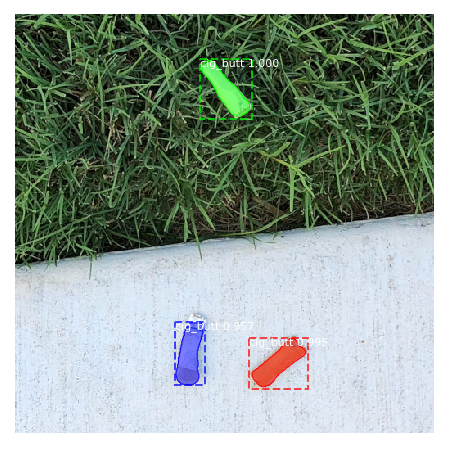

In [101]:
# import skimage

real_test_dir = 'data/cig_butts/real_test'
image_paths = []
for filename in os.listdir(real_test_dir):
    if os.path.splitext(filename)[1].lower() in ['.png', '.jpg', '.jpeg']:
        image_paths.append(os.path.join(real_test_dir, filename))

for image_path in image_paths:
    img = skimage.io.imread(image_path)
    img_arr = np.array(img)
    results = rcnn_model.detect([img_arr], verbose=1)
    r = results[0]
    visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], 
                                ['BG', 'cig_butt'], r['scores'], figsize=(8,8))

In [36]:
def cropped_cig(img, roi ,mask):
    output = []
    height, width = (512, 512)
    bgdModel = np.zeros((1,65), np.float64)
    fgdModel = np.zeros((1,65), np.float64)
    area = tuple((roi[0][1], roi[0][0], roi[0][3], roi[0][2]))
    # that was unpleasant
    mask = mask.astype('uint8')
    
    cv2.grabCut(img, mask, area, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)
    mask = np.where((mask==2)|(mask==0),0,1).astype('uint8')
    cropped_img = img * mask[:,:,np.newaxis]
    output.append(cropped_img)
        
    return np.array(output)[0]

In [37]:
test = cropped_cig(val_img[1], r['rois'], r['masks'][:,:,0].astype('uint8'))

In [202]:
np.unique(r['masks'][:,:,0].astype('uint8'))

array([0, 1], dtype=uint8)

In [277]:
r['rois']

array([[154, 104, 219, 157]], dtype=int32)

## actually still works very bad with same bg 

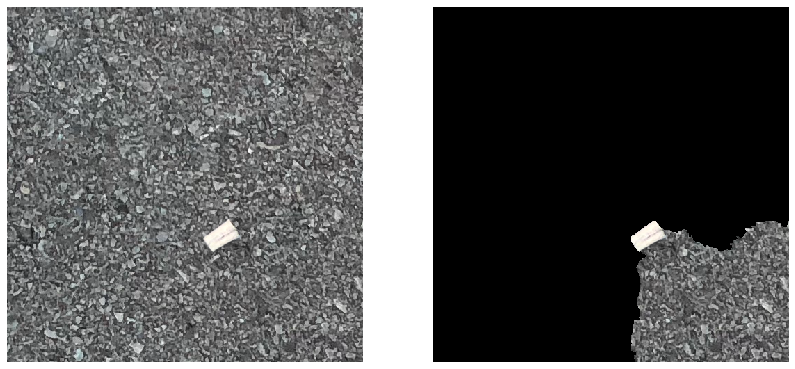

In [38]:
show_img_with_mask(val_img[1], test) # let's show what'll be

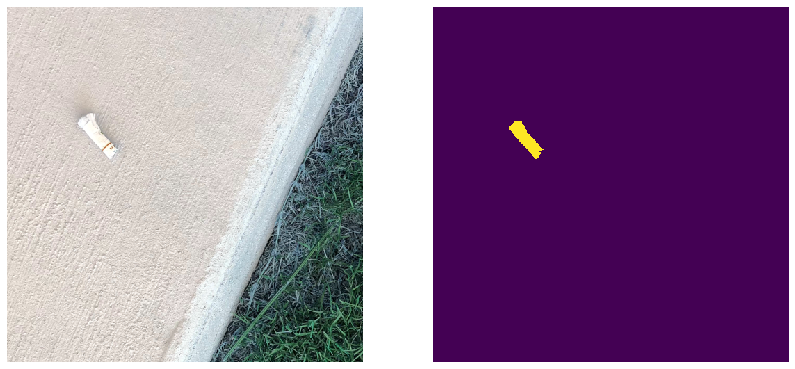

In [181]:
show_img_with_mask(test_img[4], test)